In [1]:
import pandas as pd

df = pd.read_csv('StrawberryRelatHumidSeasonData.csv', parse_dates=True)
df.head()


,StationID,StationName,Date,Time,RelatHumidity,doy,tod
0,320,APOPKA,2005-11-01,00:00:00,95.9,305,1
1,320,APOPKA,2005-11-01,00:15:00,96.2,305,2
2,320,APOPKA,2005-11-01,00:30:00,96.5,305,3
3,320,APOPKA,2005-11-01,00:45:00,96.3,305,4
4,320,APOPKA,2005-11-01,01:00:00,96.2,305,5


In [2]:
df.tail()

,StationID,StationName,Date,Time,RelatHumidity,doy,tod
1559321,302,UMATILLA,2022-02-28,22:45:00,89.0,59,92
1559322,302,UMATILLA,2022-02-28,23:00:00,89.2,59,93
1559323,302,UMATILLA,2022-02-28,23:15:00,89.7,59,94
1559324,302,UMATILLA,2022-02-28,23:30:00,90.0,59,95
1559325,302,UMATILLA,2022-02-28,23:45:00,90.5,59,96


In [3]:
df.shape

(1559326, 7)

In [4]:
df_days = df.groupby(['StationName','Date'])[['StationName','RelatHumidity']].mean()
df_days = df_days.reset_index()
df_days.tail(15)

,StationName,Date,RelatHumidity
16285,UMATILLA,2022-02-14,48.028750
16286,UMATILLA,2022-02-15,72.988646
16287,UMATILLA,2022-02-16,77.271042
16288,UMATILLA,2022-02-17,81.154167
16289,UMATILLA,2022-02-18,81.838229
16290,UMATILLA,2022-02-19,66.962500
16291,UMATILLA,2022-02-20,65.589271
16292,UMATILLA,2022-02-21,71.548542
16293,UMATILLA,2022-02-22,75.023958
16294,UMATILLA,2022-02-23,80.792083


In [7]:
df_days.shape
df_days.to_csv('TESTE_MEDIAS.csv', index=False)

In [8]:
res = df_days[~(df_days['Date'] > '2021-03-01')]

In [9]:
res.shape

(15284, 3)

In [10]:
dfApo = res.loc[(res['StationName'] == 'APOPKA') & (res['RelatHumidity'] < 101), ['Date','RelatHumidity']]
dfApo.rename(columns={"RelatHumidity": "APOPKA"}, inplace=True)
dfApo = dfApo.reset_index(drop=True)

dfArc = res.loc[(res['StationName'] == 'ARCADIA') & (res['RelatHumidity'] < 101), ['RelatHumidity']]
dfArc.rename(columns={"RelatHumidity": "ARCADIA"}, inplace=True)
dfArc = dfArc.reset_index(drop=True)

dfBal = res.loc[(res['StationName'] == 'BALM') & (res['RelatHumidity'] < 101), ['RelatHumidity']]
dfBal.rename(columns={"RelatHumidity": "BALM"}, inplace=True)
dfBal = dfBal.reset_index(drop=True)

dfBro = res.loc[(res['StationName'] == 'BRONSON') & (res['RelatHumidity'] < 101), ['RelatHumidity']]
dfBro.rename(columns={"RelatHumidity": "BRONSON"}, inplace=True)
dfBro = dfBro.reset_index(drop=True)

dfCit = res.loc[(res['StationName'] == 'CITRA') & (res['RelatHumidity'] < 101), ['RelatHumidity']]
dfCit.rename(columns={"RelatHumidity": "CITRA"}, inplace=True)
dfCit = dfCit.reset_index(drop=True)

dfDov = res.loc[(res['StationName'] == 'DOVER') & (res['RelatHumidity'] < 101), ['RelatHumidity']]
dfDov.rename(columns={"RelatHumidity": "DOVER"}, inplace=True)
dfDov = dfDov.reset_index(drop=True)

dfFlo = res.loc[(res['StationName'] == 'FLORAL CITY') & (res['RelatHumidity'] < 101), ['RelatHumidity']]
dfFlo.rename(columns={"RelatHumidity": "FLORAL CITY"}, inplace=True)
dfFlo = dfFlo.reset_index(drop=True)

dfLak = res.loc[(res['StationName'] == 'LAKE ALFRED') & (res['RelatHumidity'] < 101), ['RelatHumidity']]
dfLak.rename(columns={"RelatHumidity": "LAKE ALFRED"}, inplace=True)
dfLak = dfLak.reset_index(drop=True)

dfPla = res.loc[(res['StationName'] == 'PLANT CITY') & (res['RelatHumidity'] < 101), ['RelatHumidity']]
dfPla.rename(columns={"RelatHumidity": "PLANT CITY"}, inplace=True)
dfPla = dfPla.reset_index(drop=True)

dfUma = res.loc[(res['StationName'] == 'UMATILLA') & (res['RelatHumidity'] < 101), ['RelatHumidity']]
dfUma.rename(columns={"RelatHumidity": "UMATILLA"}, inplace=True)
dfUma = dfUma.reset_index(drop=True)

dfs = [dfApo, dfArc, dfBal, dfBro, dfCit, dfDov, dfFlo, dfLak, dfPla, dfUma]


In [11]:
dfApo.head()

,Date,APOPKA
0,2005-11-01,88.466146
1,2005-11-02,84.750521
2,2005-11-03,77.885000
3,2005-11-04,78.043333
4,2005-11-05,78.990938


In [12]:
df05_22 = pd.concat(dfs, axis=1)

In [13]:
df05_22.head()

,Date,APOPKA,ARCADIA,BALM,BRONSON,CITRA,DOVER,FLORAL CITY,LAKE ALFRED,PLANT CITY,UMATILLA
0,2005-11-01,88.466146,88.645833,90.626042,88.690521,92.278333,90.942708,NaN,87.975625,NaN,92.956250
1,2005-11-02,84.750521,82.169063,85.806354,76.152500,83.720625,84.022396,NaN,82.622917,NaN,87.790000
2,2005-11-03,77.885000,77.655312,80.279271,74.553646,80.214375,78.789167,NaN,78.988750,NaN,83.716354
3,2005-11-04,78.043333,72.221250,74.299479,75.731042,82.311875,76.740938,NaN,74.785729,NaN,82.792500
4,2005-11-05,78.990938,79.352396,81.103333,77.862083,82.747500,76.133750,NaN,77.249271,NaN,83.945104


In [14]:
df05_22.shape

(1920, 11)

In [15]:

# Number of rows to drop
n = 20
 
# Dropping last n rows using drop
df05_22.drop(df05_22.tail(n).index,
        inplace = True)

df05_22.tail()

,Date,APOPKA,ARCADIA,BALM,BRONSON,CITRA,DOVER,FLORAL CITY,LAKE ALFRED,PLANT CITY,UMATILLA
1895,2021-02-09,83.390521,63.158854,82.368437,NaN,74.063750,65.540104,NaN,59.362292,NaN,65.560938
1896,2021-02-10,83.083229,71.268854,78.721875,NaN,93.111458,74.124896,NaN,68.624479,NaN,66.035625
1897,2021-02-11,78.221979,89.196250,79.557083,NaN,88.647604,91.762500,NaN,89.819792,NaN,86.178125
1898,2021-02-12,80.699271,85.016042,81.207500,NaN,84.023125,85.711667,NaN,84.289583,NaN,84.765104
1899,2021-02-13,85.952812,86.314583,82.413542,NaN,92.279167,86.021771,NaN,86.030208,NaN,84.239583


In [16]:
df05_22.shape

(1900, 11)

In [17]:
df_uniform = df05_22.drop(columns=['FLORAL CITY', 'PLANT CITY'], axis=1)
df_uniform.head()

,Date,APOPKA,ARCADIA,BALM,BRONSON,CITRA,DOVER,LAKE ALFRED,UMATILLA
0,2005-11-01,88.466146,88.645833,90.626042,88.690521,92.278333,90.942708,87.975625,92.956250
1,2005-11-02,84.750521,82.169063,85.806354,76.152500,83.720625,84.022396,82.622917,87.790000
2,2005-11-03,77.885000,77.655312,80.279271,74.553646,80.214375,78.789167,78.988750,83.716354
3,2005-11-04,78.043333,72.221250,74.299479,75.731042,82.311875,76.740938,74.785729,82.792500
4,2005-11-05,78.990938,79.352396,81.103333,77.862083,82.747500,76.133750,77.249271,83.945104


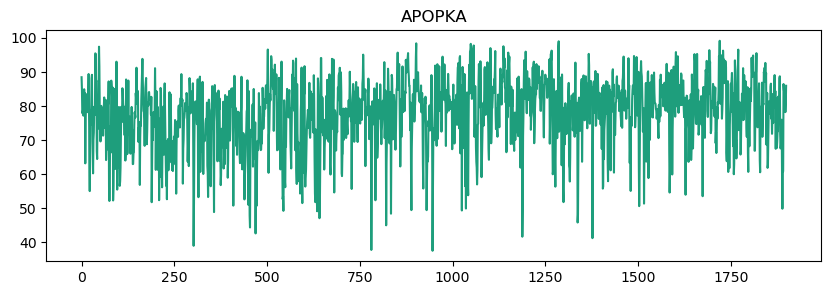

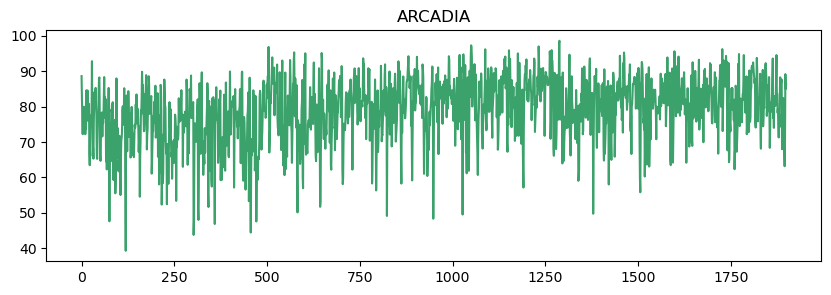

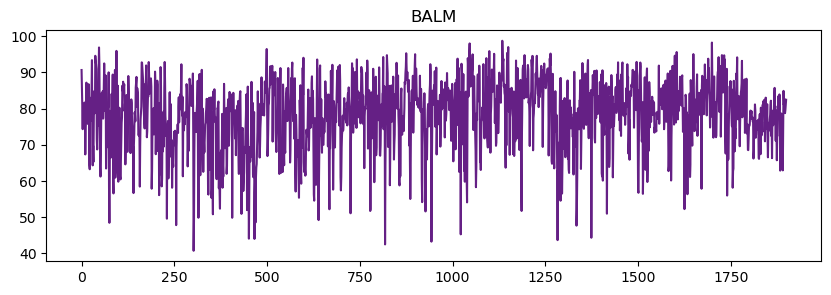

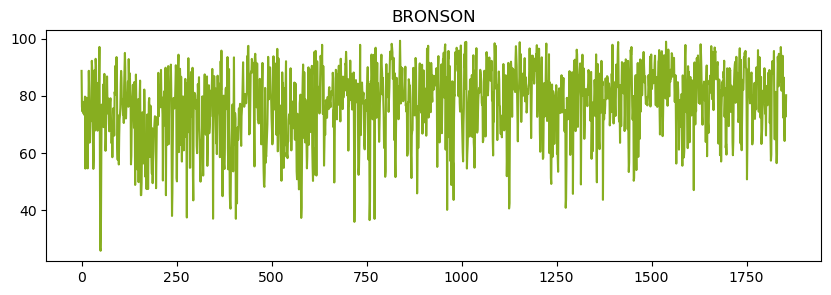

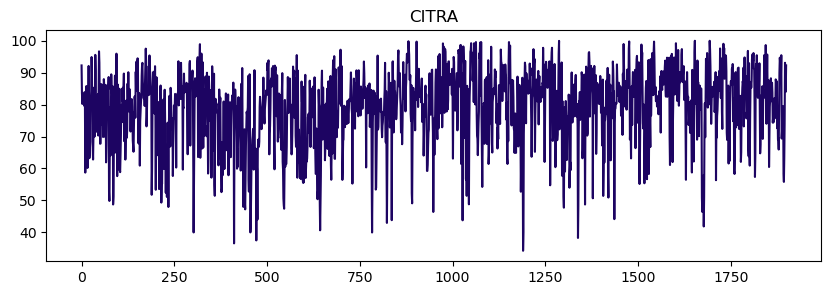

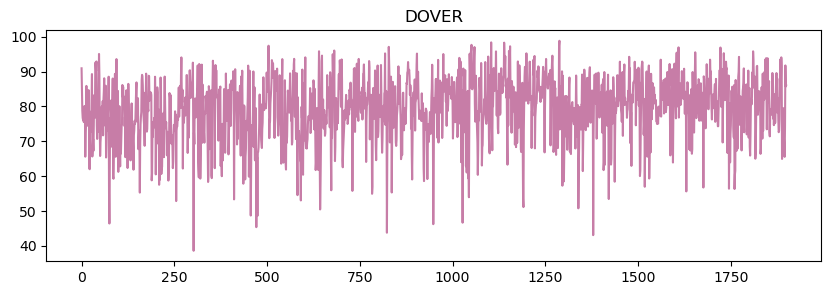

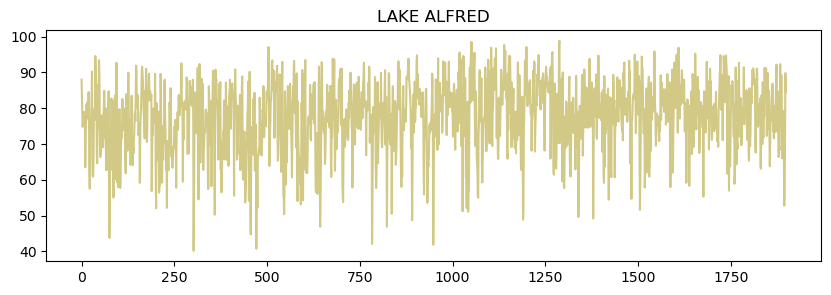

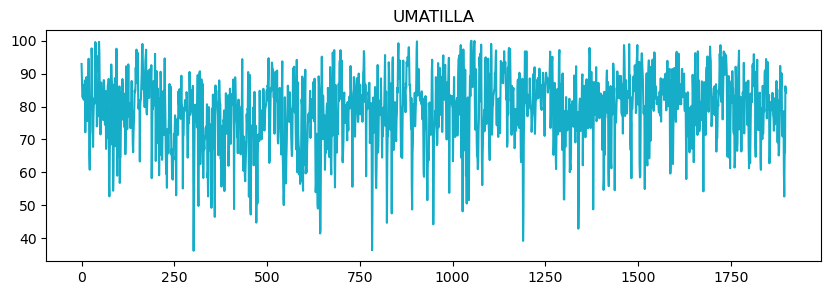

In [18]:
# grid of plots
import os
import math
# Essential Libraries
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

for column in df_uniform:
    if (column != 'Date'):
        plt.figure(figsize=(10,3))
        plt.title(column)
        plt.plot(df_uniform[column], '-',c=(np.random.random(), np.random.random(), np.random.random()))



#plt.plot(df05_22['APOPKA'], '-',color="blue")


In [19]:
df_uniform.shape

(1900, 9)

In [20]:
df_uniform.tail()

,Date,APOPKA,ARCADIA,BALM,BRONSON,CITRA,DOVER,LAKE ALFRED,UMATILLA
1895,2021-02-09,83.390521,63.158854,82.368437,NaN,74.063750,65.540104,59.362292,65.560938
1896,2021-02-10,83.083229,71.268854,78.721875,NaN,93.111458,74.124896,68.624479,66.035625
1897,2021-02-11,78.221979,89.196250,79.557083,NaN,88.647604,91.762500,89.819792,86.178125
1898,2021-02-12,80.699271,85.016042,81.207500,NaN,84.023125,85.711667,84.289583,84.765104
1899,2021-02-13,85.952812,86.314583,82.413542,NaN,92.279167,86.021771,86.030208,84.239583


In [21]:
data_array = np.array(df_uniform)
data_array.shape

(1900, 9)

In [22]:
data = df_uniform[['APOPKA','ARCADIA','BALM','BRONSON','CITRA','DOVER','LAKE ALFRED','UMATILLA']].transpose()
data.head()

,0,1,2,3,4,5,6,7,8,9,...,1890,1891,1892,1893,1894,1895,1896,1897,1898,1899
APOPKA,88.466146,84.750521,77.885000,78.043333,78.990938,77.182604,78.282083,84.936458,81.109375,83.774271,...,60.813333,60.835312,86.470417,84.603646,84.470312,83.390521,83.083229,78.221979,80.699271,85.952812
ARCADIA,88.645833,82.169063,77.655312,72.221250,79.352396,78.165729,79.995729,77.449687,76.854167,77.123646,...,74.974583,82.461771,79.404375,69.620417,66.901875,63.158854,71.268854,89.196250,85.016042,86.314583
BALM,90.626042,85.806354,80.279271,74.299479,81.103333,77.573646,79.519792,79.624375,81.649167,79.647708,...,62.930417,74.022396,84.870833,80.987604,82.703125,82.368437,78.721875,79.557083,81.207500,82.413542
BRONSON,88.690521,76.152500,74.553646,75.731042,77.862083,73.818021,74.874479,73.358021,76.948854,79.694896,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CITRA,92.278333,83.720625,80.214375,82.311875,82.747500,81.565417,81.141354,79.669271,83.904896,81.503542,...,79.250417,79.499792,58.413229,55.794896,63.188333,74.063750,93.111458,88.647604,84.023125,92.279167


In [23]:
data_array = np.array(data)

In [44]:

from tslearn.clustering import TimeSeriesKMeans

model = TimeSeriesKMeans(n_clusters=3, metric="dtw", max_iter=10)
y_pred = model.fit_predict(data_array)

In [45]:
y_pred.shape

(8,)

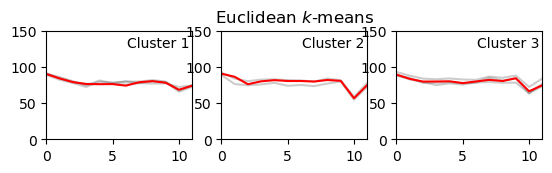

In [46]:
plt.figure()
for yi in range(3):
    plt.subplot(3, 3, yi + 1)
    for xx in data_array[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(model.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, 11)
    plt.ylim(0, 150)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == 1:
        plt.title("Euclidean $k$-means")

In [47]:
import sys
import numpy
numpy.set_printoptions(threshold=sys.maxsize)
print(y_pred)

[2 0 0 1 1 0 2 2]


In [28]:
data_array.shape

(8, 1900)

In [48]:
from tslearn.clustering import TimeSeriesKMeans

model = TimeSeriesKMeans(n_clusters=2, metric="dtw", max_iter=10)
y_pred = model.fit_predict(data_array)
y_pred.shape

(8,)

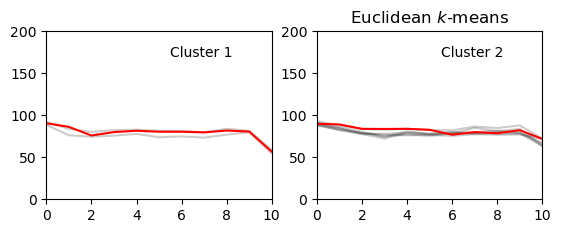

In [49]:
plt.figure()
for yi in range(2):
    plt.subplot(2, 2, yi + 1)
    for xx in data_array[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(model.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, 10)
    plt.ylim(0, 200)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == 1:
        plt.title("Euclidean $k$-means")

In [50]:
import sys
import numpy
numpy.set_printoptions(threshold=sys.maxsize)
print(y_pred)

[1 1 1 0 0 1 1 1]


In [107]:
model.cluster_centers_.shape

(3, 8, 1)

ValueError: x and y must have same first dimension, but have shapes (1900,) and (8,)

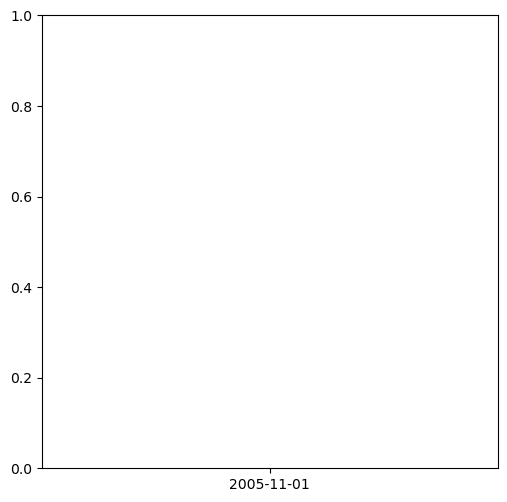

In [108]:
plt.figure(figsize=(20,20))
k_dict = {'1':0,'2':0,'3':0,'4':1,'5':1,'6':1,'7':2,'8':2,'9':2}
colors = ['navy']*3+['darkorange']*3+['k']*3
Names = ['Class 0']*3+['Class 1']*3+['Class 2']*3
for j in range(1,10):
    plt.subplot(3,3,j)
    k = np.random.choice(np.where(y==k_dict[str(j)])[0])
    plt.plot(df_uniform.Date,data_array[k],'.',color=colors[j-1])
    plt.ylabel('Temperature',fontsize=20)
    plt.xlabel('Time',fontsize=20)
    plt.title('City=%s, Class = %s'%(cities_list[k],Names[j-1]),fontsize=20)
    plt.ylim(data_array.min(),data_array.max())

ValueError: 'a' cannot be empty unless no samples are taken

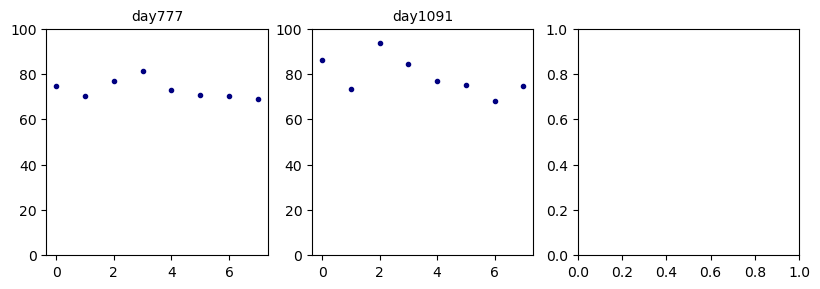

In [59]:
plt.figure(figsize=(20,10))
k_dict = {'1':0,'2':0,'3':1,'4':1,'5':2,'6':2,'7':3,'8':3}
colors = ['navy']*6+['darkorange']*6+['k']*6

for j in range(1,9):
    plt.subplot(3,6,j)
    k = np.random.choice(np.where(y==k_dict[str(j)])[0])
    plt.plot(data_array[k],'.',color=colors[j-1])
    plt.title('day'+str(k), fontsize=10)
    plt.ylim(0,100)

In [2]:
from pandas_profiling import ProfileReport

profile = ProfileReport(df, title="Data Profile")

In [3]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]